In [122]:
import tensorflow as tf
import numpy as np
import pandas as pd



In [121]:
try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [130]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)



       

TF version: 2.12.0
TF Hub version: 0.13.0


Dog breed classification project:
1. Problem: Identify the breed of a dog given an image of a dog
2. Data: The data we using is from the kaggle identification problem
3. Evaluation :The evaluation is a file prediction probability for each dog breed of each test image
4. features : some info about the data suh as 
"We will be dealing with images (unstructured data) so we ll be using transferlearning and deep learning"
there are 120 breeds of dog and around 10000 samples of images in training and testing data




In [131]:
import tensorflow_hub as hub

# getting our data ready
 we need our machine learning model and our data has to be in numerical format. 
 



In [135]:
#check out the labels or our data
labels_csv = pd.read_csv("/content/drive/MyDrive/Dogbreed/labels.csv")

In [136]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [137]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

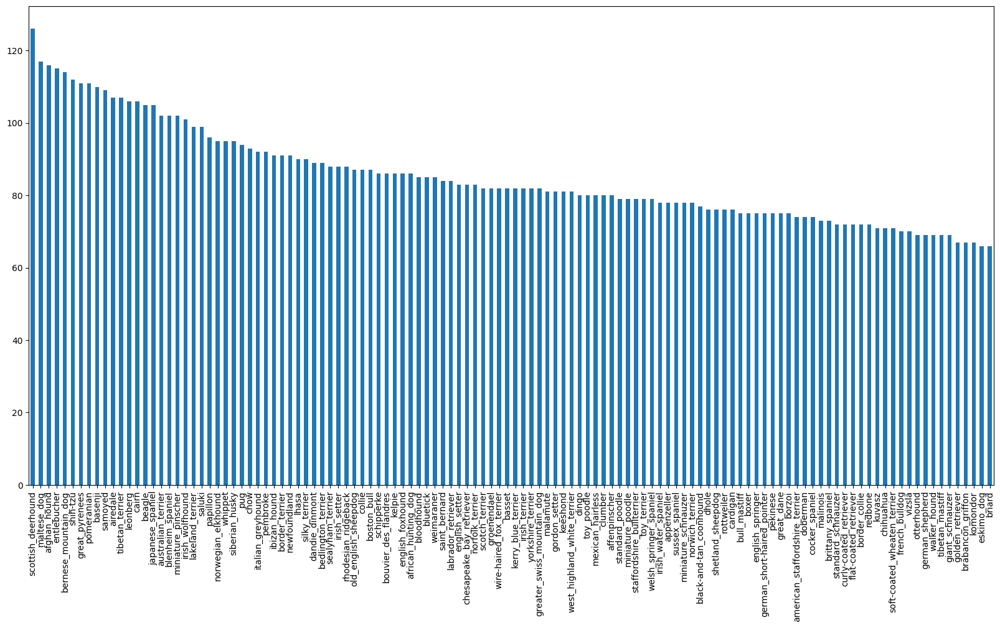

In [138]:
# how many breed are there in the csv
labels_csv["breed"].value_counts().plot.bar(figsize =(20,10))

In [140]:
#what's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

In [142]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


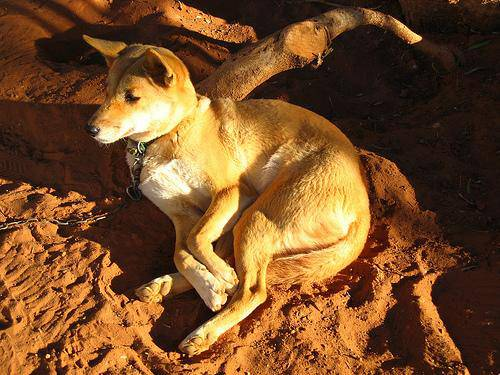

In [143]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dogbreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

# Getting images ready and their labels through drive

In [144]:
filenames = ["/content/drive/MyDrive/Dogbreed/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Dogbreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dogbreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dogbreed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dogbreed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dogbreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dogbreed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dogbreed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dogbreed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dogbreed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dogbreed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [145]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dogbreed/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [146]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [147]:
#since we've now got our training image file path in a list 
#prepare the labels is more important

import numpy as np
labels = labels_csv["breed"].to_numpy()
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [148]:
len(labels)

10222

In [149]:

# checking if the number of labels matching the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directory")  




Number of labels matches number of filenames!


In [150]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [151]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [152]:
# turns a single label into an array of  booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [153]:

# turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [154]:
len(boolean_labels)

10222

In [157]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occu

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [158]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [159]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [160]:
filenames[:10]

['/content/drive/MyDrive/Dogbreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dogbreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dogbreed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dogbreed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dogbreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dogbreed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dogbreed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dogbreed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dogbreed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dogbreed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

# creating our own validation set
since the is not in a validation set therefore we have to create it

In [161]:
# setup x and y variable
x = filenames
y = boolean_labels


In [162]:

len(filenames)

10222

# for the prediction of images we are using 1000 images and increase as need

In [163]:
# set number of images to use to experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}


In [164]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [165]:
#lets have a geez at the training data
x_train[:5],y_train[:2]

(['/content/drive/MyDrive/Dogbreed/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dogbreed/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dogbreed/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dogbreed/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dogbreed/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, 

# processing images(turning images into tensors)
to prepare our image into tensors we're going to write a function which does a few things :
1. Take an image file path as input
2. use tensorflow to read the file and save it to a variable ,image
3. turn on image (a jpg) into tensors
4. resize the image to be shaped as default(224,224)
5. return the modified image .


In [166]:
#CONVERT IMAGE INTO NUMPY ARRAY
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [167]:
image.max(), image.min()

(255, 0)

In [168]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [169]:
#turning image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

# Now the image looks like a tensor lets make a function to process them.
We'll create a function to:
1. Take an image filepath as input
2. Use Tensorflow to read and save it to a variable image
3. Turn our image(a jpg) into tensors
4. Normalize our image(convert color channel values from from 0-255 to 0-1)
5. Resize the image to be shaped(224,224)
6. Return the modified image.


In [170]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning data into batches:
For the larger amount of data we use batches that can take 32 iamge at a time so that it is efficiently used in our model
we know that we have 10000+ images and in one go they all not might into memory so we have to turn our data into batches
In order to use tensorflow efficiently we need our data in the form of tensors tuples which look like this(image ,label)


In [171]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [172]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# NOW we got a way to turn our data into tuple of tensors in the form (image,label)
# LEts make a fucntio to all our data (X AND Y) into batches!

In [174]:
# define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch
                                              



In [175]:
# create training and validation data_batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val)

Creating training data batches...
Creating training data batches...


In [176]:
# check out different attribute of our data
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing our data batches
our data is now in batches lets visualize them


In [177]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [178]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

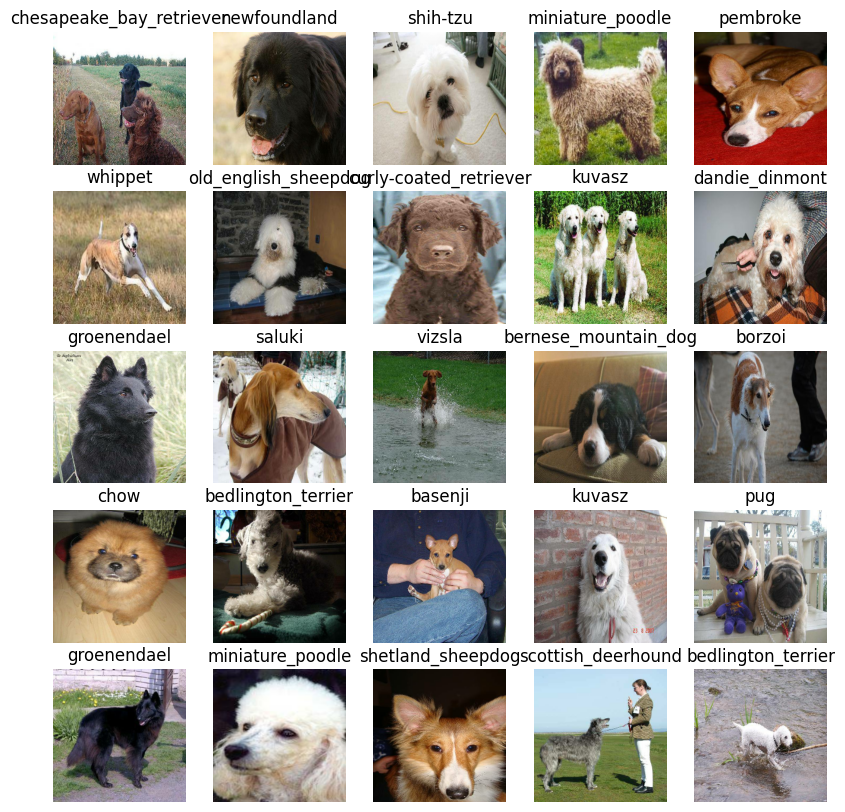

In [179]:
#lets visualize the data in the training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

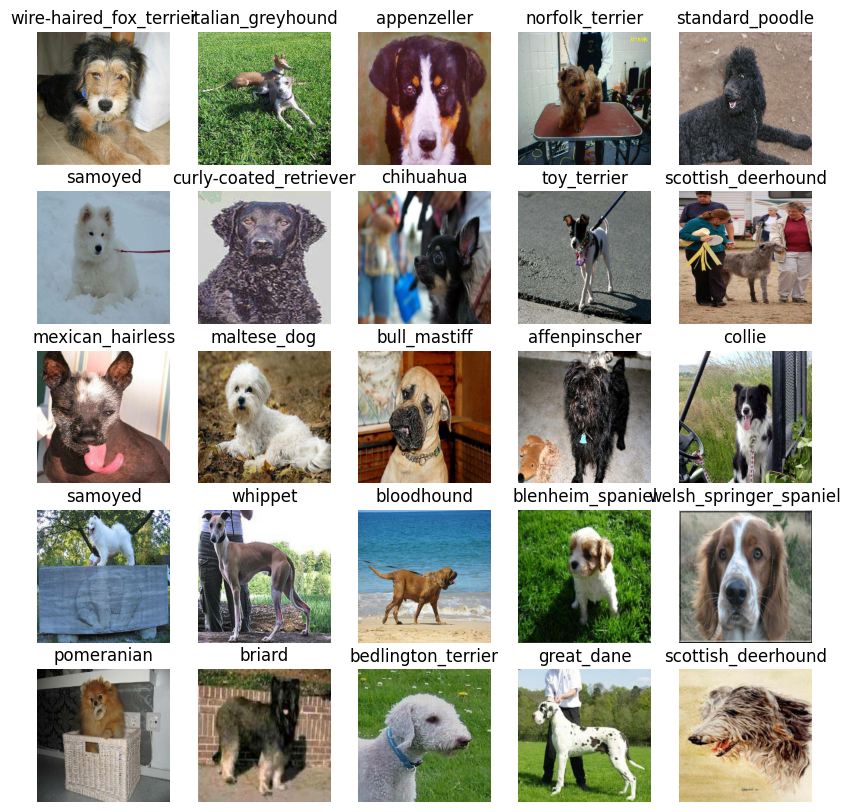

In [181]:
#  Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
there are something to deine 
such as:
1. the input shape(our images shape, in the form of tensors) to our model
2. the output shape(image label, in the form of tensors) in our model
the url of the model we want to use from tensorflow hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4



In [182]:
IMG_SIZE

224

In [183]:
# setup input shape of the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE, 3]# batch hight width ,color channel
# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
#setup model from the url from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [184]:
INPUT_SHAPE

[None, 224, 224, 3]

now we've got our input,ouput and model ready to go 
lets put them into keras deep elarning model
1. takes input output shape of a parameter
2. defines the layer of keras model
3. compiles the model\
4. Build the model
5. return the model





In [185]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [186]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#   Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

# TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

Load the TensorBoard notebook extension ✅
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [188]:
# load tensorboard notebook extension
%load_ext tensorboard
import datetime

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [189]:


import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dogbreed/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping Callback
early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric improving

In [190]:

# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model(on subwset of data)
our first moel is only going to train on thousand images, to make to sure everything is working


In [191]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [193]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


# Lets create a function which trains model.
1. create a model using `create_model`
2. setup a tensorboard callback using `create tensorboard callback`
3. call the fit() function on our model passing it the training data, validation data ,no of epochs to train for(`NUM_EPOCHS`) and the callbacks we'd like to use 
4. return the model

In [194]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [195]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 8s 159ms/step - loss: 4.6346 - accuracy: 0.1037 - val_loss: 3.4761 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6826 - accuracy: 0.6700 - val_loss: 2.1660 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 4s 175ms/step - loss: 0.5777 - accuracy: 0.9300 - val_loss: 1.6860 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 114ms/step - loss: 0.2595 - accuracy: 0.9875 - val_loss: 1.4874 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 119ms/step - loss: 0.1531 - accuracy: 0.9962 - val_loss: 1.4171 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1036 - accuracy: 0.9975 - val_loss: 1.3721 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

It looks like our model is overfitting because its performing far better on the training dataset than the validation dataset what are some way to prevent overfitting the deep learning neural network

NOTE : overfitting to begin with is a good start to our model learning 

# Checking the TensorBoard logs
The tensorboard magic function % tensorboard will access the logs directory we created earlieer and visualize its content


In [196]:
from tensorflow.keras.callbacks import TensorBoard

In [197]:
%load_ext tensorboard 


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


/content/drive/MyDrive/Dog breed identification machine learning

In [198]:
%tensorboard --logdir /content/drive/MyDrive/Dogbreed/logs

Output hidden; open in https://colab.research.google.com to view.

In [199]:
# Making and evaluating predictions using a trained model
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [200]:
# MAKE PREDICTION ON THE VALIDATION DATA(NOT USED TO TRAIN ON)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 67s 1s/step


array([[4.3603345e-03, 5.3289852e-05, 9.7532040e-03, ..., 8.2148192e-03,
        7.2745158e-04, 2.5307450e-02],
       [1.2056426e-04, 2.9682377e-04, 4.5020304e-05, ..., 1.3465579e-05,
        2.1379679e-03, 3.3410097e-04],
       [1.4067953e-05, 1.3292846e-04, 4.2912737e-04, ..., 1.4932369e-04,
        7.5193515e-05, 1.6741666e-04],
       ...,
       [7.7014312e-04, 2.9943762e-05, 7.6395087e-04, ..., 1.7058775e-03,
        2.8972587e-04, 3.6252090e-03],
       [2.5681937e-03, 1.2885542e-03, 1.9107347e-04, ..., 4.5143213e-04,
        2.7239381e-05, 2.0364278e-03],
       [3.7531187e-05, 7.3015540e-06, 8.8628767e-05, ..., 1.3599719e-04,
        4.2503587e-05, 1.1260331e-05]], dtype=float32)

In [201]:
predictions[0]

array([4.3603345e-03, 5.3289852e-05, 9.7532040e-03, 9.2062209e-04,
       4.6184441e-04, 5.3624488e-05, 7.9328613e-04, 5.4695535e-02,
       8.4800285e-04, 1.3544962e-03, 2.6068205e-03, 1.2428891e-04,
       2.3155067e-04, 5.0850838e-05, 4.0097329e-05, 2.2252279e-03,
       3.8932981e-03, 7.4068205e-03, 1.3920434e-05, 5.6643642e-02,
       1.2400298e-03, 1.1675712e-03, 2.3245995e-03, 4.1761005e-04,
       7.8181081e-05, 3.2529706e-04, 2.7568534e-01, 4.6328705e-02,
       1.2366895e-03, 6.5680467e-02, 2.0880224e-04, 2.5534244e-05,
       2.5563888e-04, 8.8920708e-05, 3.1933474e-04, 3.3565526e-04,
       3.6968396e-04, 1.4794347e-04, 2.5710315e-04, 2.7716541e-04,
       8.7913926e-05, 2.7926921e-04, 2.5841128e-04, 8.2077677e-05,
       6.0940260e-04, 9.7494982e-03, 2.3488193e-04, 2.3868144e-03,
       2.3018802e-04, 3.3177325e-04, 6.5062515e-04, 3.8989569e-04,
       2.0312840e-05, 9.6296432e-04, 6.1247442e-03, 3.2079615e-02,
       1.4681100e-04, 6.6958582e-03, 1.3587448e-03, 4.2475257e

In [202]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.79832951e-04 1.32960337e-03 4.92103172e-05 2.77849962e-04
 6.65955577e-06 1.08904882e-04 1.20722526e-03 3.30385556e-05
 2.20549118e-04 2.20398251e-05 2.92857469e-04 4.64579716e-05
 1.34712944e-04 2.96575046e-04 3.22090724e-04 9.76553201e-05
 7.62117488e-05 4.01956713e-05 6.91018417e-04 1.93810884e-05
 7.79023976e-05 1.17514683e-05 1.69749939e-04 8.28192642e-05
 5.73850702e-04 4.33415016e-06 1.30106919e-05 4.13001289e-05
 5.63473441e-04 1.16633209e-05 9.00050145e-06 3.26932204e-05
 3.37960292e-03 2.91594450e-04 3.71241513e-05 2.43812101e-05
 1.64979472e-04 4.37312792e-06 7.78736605e-04 1.61341799e-04
 5.77827974e-04 1.31766006e-04 2.88784126e-04 2.61403384e-05
 2.81594257e-04 1.22049660e-05 3.88895132e-04 6.13746088e-05
 2.40752015e-05 1.10097148e-03 4.66669677e-03 3.44181899e-05
 1.46675548e-05 1.42429335e-05 6.26748311e-04 7.09739761e-05
 9.68365312e-01 1.00591977e-03 1.27052102e-04 1.99416449e-04
 1.23881196e-04 4.53416753e-04 3.30781259e-05 6.48662126e-06
 1.84820587e-04 2.377248

In [ ]:
unique_breeds[113]

PREDICTION PROBABILITY IS ALWAYS BETTER AND THE IMAGE PREDICTION IS BEING MADE


In [208]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'pomeranian'

In [207]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [209]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.7230641 , 0.6282383 , 0.4686088 ],
         [0.6791478 , 0.5755501 , 0.37405324],
         [0.6923763 , 0.57445794, 0.32741308],
         ...,
         [0.64036876, 0.5893884 , 0.5148786 ],
         [0.6344275 , 0.5834471 , 0.5089373 ],
         [0.6278624 , 0.576882  , 0.50237215]],
 
        [[0.9598593 , 0.8956167 , 0.84033763],
         [0.8051112 , 0.7342037 , 0.6179354 ],
         [0.6819063 , 0.5944868 , 0.4063968 ],
         ...,
         [0.6212501 , 0.5741913 , 0.4858228 ],
         [0.62352943, 0.5764706 , 0.49012202],
         [0.6268558 , 0.57979697, 0.49128026]],
 
        [[0.9824008 , 0.96287817, 0.99978757],
         [0.99955726, 0.99170375, 0.9563361 ],
         [0.8634895 , 0.8178691 , 0.6740286 ],
         ...,
         [0.6326069 , 0.5869984 , 0.48193866],
         [0.63529414, 0.5885906 , 0.4859122 ],
         [0.6389006 , 0.5933724 , 0.48813793]],
 
        ...,
 
        [[0.2512955 , 0.05521707, 0.16109943],
         [0.24768905, 0.05161062, 0.15749

Now we got ways to get 
1. prediction label
2. validation label(truth label)
3. validation images

# we are making a function to visualize images and labels 
 we ll create a function which:
 1. takes an array of prediction probability,probability an array of truth label and an array of images and an integer
 2. convert the prediction probability to a predicted label
 3. prot the predicted label ,its predicted probability, the truth label and the target image on a single plot



In [210]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

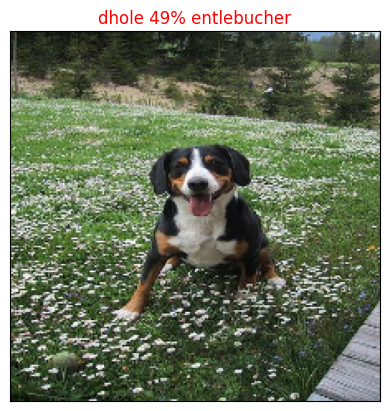

In [211]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

Take an input of prediction probabilities array and a ground truth array and an integer ✅
Find the prediction using get_pred_label() ✅
Find the top 10:
Prediction probabilities indexes ✅
Prediction probabilities values ✅
Prediction labels ✅
Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [212]:

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

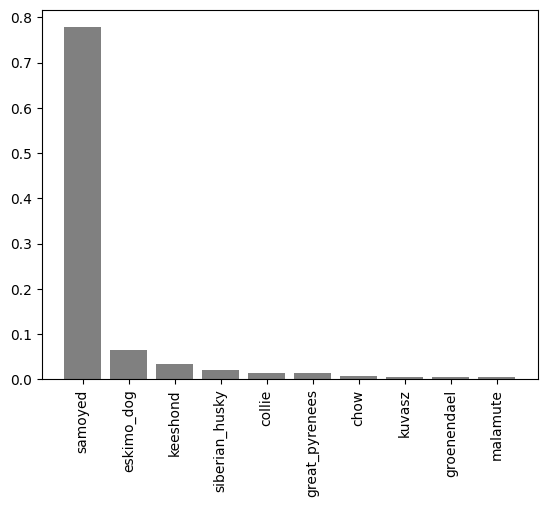

In [213]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

now we've got some  function to help us visualize our prediction and evaluate our modle lets check the view


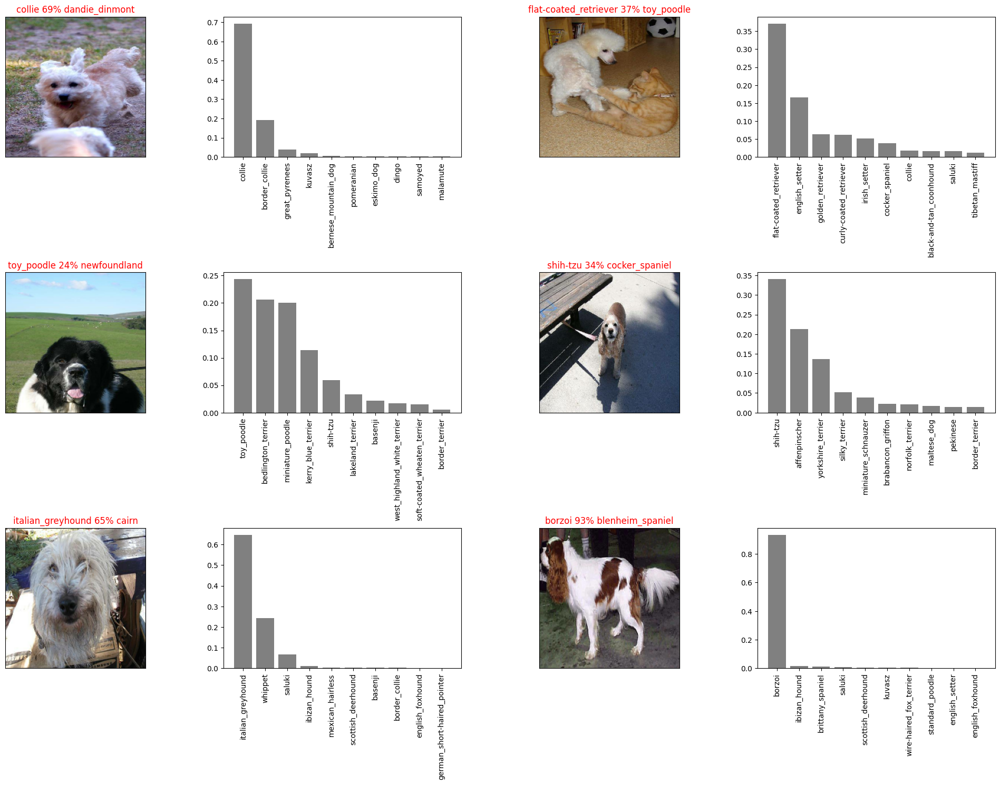

In [214]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#  Saving and reloading a trained model


In [219]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dogbreed/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [220]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we got our function to save and load a trained model ,lets make sure they work!


In [221]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dogbreed/models/20230419-10111681899061-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dogbreed/models/20230419-10111681899061-1000-images-mobilenetv2-Adam.h5'

In [222]:
# load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dogbreed/models/20230419-10111681899061-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dogbreed/models/20230419-10111681899061-1000-images-mobilenetv2-Adam.h5


In [223]:
#Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.3246 - accuracy: 0.6450


[1.3245676755905151, 0.6449999809265137]

In [224]:
#evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 102ms/step - loss: 1.3246 - accuracy: 0.6450


[1.3245679140090942, 0.6449999809265137]

# Training a big model on the full data

In [225]:
len(x),len(y)

(10222, 10222)

In [226]:
# create a data bvatch with full dataset
full_data = create_data_batches(x,y)


Creating training data batches...


In [227]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [228]:
# create a model of full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [229]:
# create full model call back
full_model_tensorboard = create_tensorboard_callback()
# no validation set when trraining on all the data ,so we can;t monitor validation set
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [230]:
# fit the full model to the full data
full_model.fit(x = full_data,
               epochs= NUM_EPOCHS,
               callbacks = [full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 38s 103ms/step - loss: 1.3328 - accuracy: 0.6681
Epoch 2/100
320/320 [==============================] - 33s 102ms/step - loss: 0.4010 - accuracy: 0.8786
Epoch 3/100
320/320 [==============================] - 33s 102ms/step - loss: 0.2384 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1543 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1093 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0776 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0583 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0448 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0370 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 33s 103m

In [231]:
save_model(full_model,suffix = "full-image-set-mobilenetv2-Adam")


Saving model to: /content/drive/MyDrive/Dogbreed/models/20230419-10241681899879-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dogbreed/models/20230419-10241681899879-full-image-set-mobilenetv2-Adam.h5'

In [232]:
# load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dogbreed/models/20230419-10241681899879-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dogbreed/models/20230419-10241681899879-full-image-set-mobilenetv2-Adam.h5


# make prediction on the test data set
since our model has been trained on images in the form of tensor batches to prediction on the test dasta we'll have to get it into the same format
luckily we created create data batches which can take a list of filenames as in put and  convert them in to the tensor batches

# To make prediciton on the test data set
1. get the image filenames
2. convert the filenames into test data batches using `create_data_batches()` and setting the test data parametere to true 
3. make prediction array by passing the test batches to the predict()method call our model

In [243]:
# load test image filenames
test_path = "/content/drive/MyDrive/Dogbreed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path) ]
test_filenames[:10]

['/content/drive/MyDrive/Dogbreed/test/e864985e40823a56d3ad8594066d0641.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e807c4b5025b0aa4dcbd5df2765aa8e4.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e85d4e2707683df0e6387e19b67b873d.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e8319b1410a984291d71a3e60c84d86c.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e806a67a05289ac6de6831001664b81b.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e8889cf9d7b2701a85be1c97661b9b26.jpg',
 '/content/drive/MyDrive/Dogbreed/test/e857866af777793d2c114b09ea7a685a.jpg']

In [244]:
len(test_filenames)

10357

In [245]:
# create a test data batch
test_data = create_data_batches(test_filenames,test_data = True)

Creating test data batches...


In [246]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [247]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose =1)

324/324 [==============================] - 213s 619ms/step


In [249]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dogbreed/preds_array.csv", test_predictions, delimiter=",")


In [251]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dogbreed/preds_array.csv", delimiter=",")

In [252]:
test_predictions[:10]


array([[3.32681758e-08, 4.66032333e-08, 1.94439281e-06, ...,
        7.92417093e-04, 2.55785466e-07, 1.28985761e-07],
       [2.23565753e-08, 1.48250735e-11, 4.33657510e-09, ...,
        1.11984236e-05, 1.10360353e-10, 2.41891196e-09],
       [2.13129125e-10, 4.20263463e-10, 9.58137042e-12, ...,
        2.17611151e-09, 6.88267798e-09, 1.11393194e-13],
       ...,
       [2.27253966e-10, 5.60622695e-08, 6.64570343e-10, ...,
        3.66917838e-08, 1.28796664e-05, 1.17322252e-09],
       [4.83783735e-10, 4.97889630e-07, 2.04291306e-10, ...,
        2.30932113e-04, 3.56908436e-09, 5.13565690e-10],
       [2.00566008e-10, 3.44699824e-10, 3.30320340e-08, ...,
        1.37032122e-10, 2.69920530e-09, 5.89591501e-11]])

In [253]:
test_predictions.shape

(10357, 120)

preparing the test data set
To get the data in this format, we'll:

Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
Add data to the ID column by extracting the test image ID's from their filepaths.
Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to get

In [254]:

# ["id"] + list(unique_breeds)

In [256]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [257]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [258]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e864985e40823a56d3ad8594066d0641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e807c4b5025b0aa4dcbd5df2765aa8e4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e85d4e2707683df0e6387e19b67b873d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [259]:
# add the prediction probabilities tow each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e864985e40823a56d3ad8594066d0641,3.326818e-08,4.660323e-08,1.944393e-06,7.460172e-07,3.870422e-06,7.318790e-09,1.111281e-08,1.141328e-10,8.486196e-11,...,2.233997e-08,4.729074e-08,3.777601e-09,6.176857e-08,3.617485e-05,7.084379e-09,1.668188e-07,7.924171e-04,2.557855e-07,1.289858e-07
1,e783e22d4f370b6cc0b1f44b4d6584a8,2.235658e-08,1.482507e-11,4.336575e-09,9.091885e-09,2.042677e-07,7.973596e-09,5.875387e-11,3.366063e-08,3.157839e-11,...,3.907060e-09,8.034433e-09,5.776313e-08,5.026983e-10,4.774629e-09,7.797602e-12,3.410959e-09,1.119842e-05,1.103604e-10,2.418912e-09
2,e807c4b5025b0aa4dcbd5df2765aa8e4,2.131291e-10,4.202635e-10,9.581370e-12,4.105368e-13,1.495253e-09,5.770503e-09,3.101307e-13,8.686886e-10,1.004208e-09,...,4.630432e-11,9.050496e-12,1.921743e-12,2.266880e-09,5.145990e-12,1.105837e-06,5.193200e-12,2.176112e-09,6.882678e-09,1.113932e-13
3,e85d4e2707683df0e6387e19b67b873d,1.206986e-08,1.977316e-11,7.937079e-11,3.185733e-06,2.403412e-05,2.434322e-11,4.771664e-08,3.720167e-12,2.131849e-10,...,2.924246e-08,4.667166e-09,7.062634e-10,1.949672e-10,5.667816e-13,5.021178e-09,2.514224e-10,9.855410e-10,1.994618e-12,3.417271e-08
4,e7fcdf9671a6593b638cbee42842f981,2.256313e-15,1.840081e-12,3.356092e-15,3.572014e-13,6.374508e-14,3.882572e-13,3.290700e-13,6.268048e-14,1.213877e-10,...,7.822099e-16,3.822309e-15,1.680161e-16,2.192243e-12,9.428849e-16,1.000000e+00,1.168777e-12,6.865884e-12,1.860608e-14,1.082689e-16


In [260]:
# save our prediction model data frame to csv for submission 
preds_df.to_csv("/content/drive/MyDrive/Dogbreed/full_model_predictions_submission_1_mobilenetV2.csv")

# make prediction on custom images
to get predictioj on custom images 
1. get the filepath of our image
2. turn the filepath into bathces using create batches and our custom image data to our model predict method
3. pass the custom image batch to our model predict method
4. convert the prediction output probability to prediction label
5. compare the predicted labels to our custom images


In [264]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dogbreed/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [266]:
custom_image_paths 

['/content/drive/MyDrive/Dogbreed/my-dog-photos/0a0f82d4557f70718efa26f8a8a7773f.jpg',
 '/content/drive/MyDrive/Dogbreed/my-dog-photos/0a1be1191b5c9d91392bb1e373600259.jpg',
 '/content/drive/MyDrive/Dogbreed/my-dog-photos/0a0b97441050bba8e733506de4655ea1.jpg']

In [268]:
# turn images into batches dataset
custom_data = create_data_batches(custom_image_paths,test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [269]:
# Make prediction on our custom data
custom_preds = loaded_full_model.predict(custom_data)


1/1 [==============================] - 2s 2s/step


In [270]:
custom_preds.shape

(3, 120)

In [271]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cairn', 'leonberg', 'black-and-tan_coonhound']

In [272]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


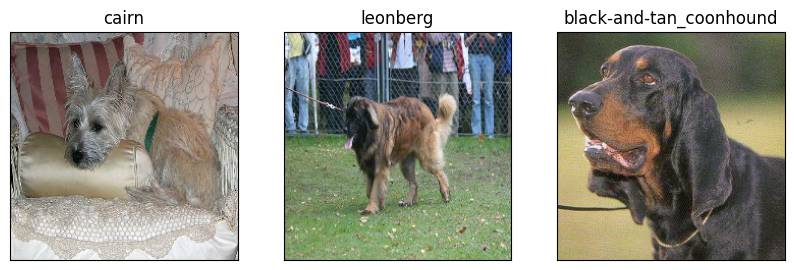

In [273]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)